In [1]:
from definitions import *
from plots import *
from Experiment import *

%load_ext autoreload
%autoreload 2

In [6]:
exp_wind = ClusteringExperiment(
    'ERA5', 'Wind', '300', None, None, -60, 60, 20, 80, 
    'anomaly', 'JJA', 'doy', {'dayofyear': ('win', 30)}, 
    {'detrended': False, 'time': ('fft', 10)}, inner_norm=None
)
exp_u = exp_wind.other('Wind', 'Low', 'u')
exp_z = exp_wind.other('Geopotential', '500')
exp_T = ClusteringExperiment(
    'ERA5', 'Temperature', '2m', 'box_-25_60_32_72', 't', 
    None, None, None, None, 'anomaly', 'JJA', 'doy', 
    {'dayofyear': ('win', 30)}, 
    {'detrended': False, 'time': ('fft', 10)}, 
    inner_norm=None
)
exp_tp = exp_T.other('Precipitation', 'surf')
da_wind = exp_wind.open_da('anomaly', 'JJA')
da_wind_abs = exp_wind.open_da(season='JJA')
da_T = exp_T.open_da('anomaly', 'JJA')
da_z = exp_z.open_da('anomaly', 'JJA')
da_tp = exp_tp.open_da('anomaly', 'JJA')
da_tp = da_tp.drop_duplicates(dim='time').interp(time=da_wind.time)
X, da_u = exp_u.prepare_for_clustering()
X = exp_u.pca_transform(X, 25)

/storage/homefs/hb22g102/mambaforge/envs/env11/lib/python3.11/site-packages/xarray/core/indexing.py:1372: PerformanceWarning: Slicing with an out-of-order index is generating 63 times more chunks
  return self.array[key]
/storage/homefs/hb22g102/mambaforge/envs/env11/lib/python3.11/site-packages/xrft/xrft.py:573: FutureWarning: Default ifft's behaviour (lag=None) changed! Default value of lag was zero (centered output coordinates) and is now set to transformed coordinate's attribute: 'direct_lag'.
  warnings.warn(msg, FutureWarning)


/storage/homefs/hb22g102/mambaforge/envs/env11/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


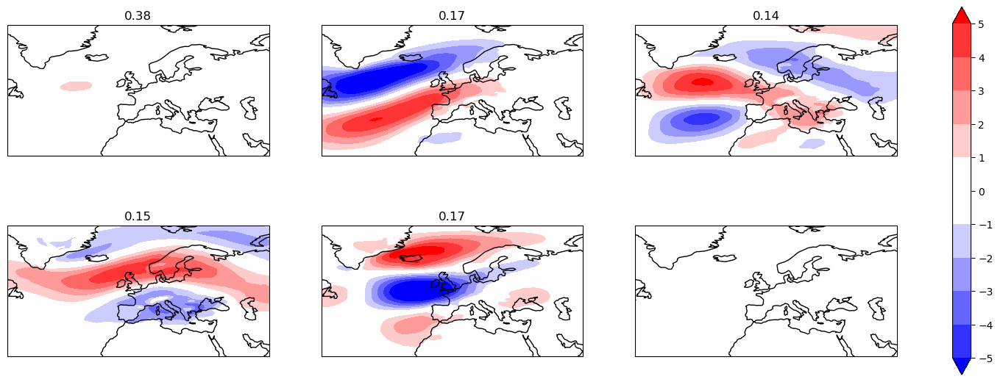

In [56]:
centers, labels, _ = exp_u.cluster(4, 8, return_type=6)
clu = Clusterplot(2, 3, region=exp_u.get_region())
clu.add_contourf(centers, titles=centers.ratios.values)

In [18]:
_, labels_z, _ = exp_z.cluster(4, 7, return_type=6)

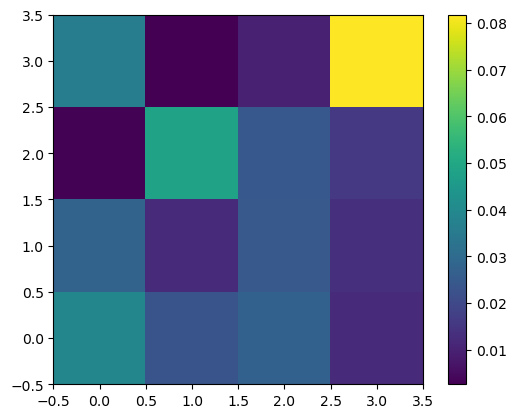

In [57]:
mask_u = label_to_mask(labels)
mask_z = label_to_mask(labels_z)
mask2D = np.mean(mask_u[:, 1:, None] & mask_z[:, None, 1:], axis=0)
im = plt.imshow(mask2D, origin='lower')
plt.colorbar(im)

In [37]:
exp_jli = Experiment('ERA5', 'Wind', 'Low', None, 'u', -60, 0, 15, 75, 'none', None, {'time': ('win', 9)})
da_jli = exp_jli.open_da(season='JJA')
da_zm = da_jli.mean(dim='lon')
LatI = da_zm.argmax(dim='lat', skipna=True)
Lat = xr.DataArray(
    da_zm.lat[LatI.values.flatten()].values, coords={"time": da_zm.time}
).rename("Lat")
Int = da_zm.isel(lat=LatI).reset_coords("lat", drop=True).rename("Int")

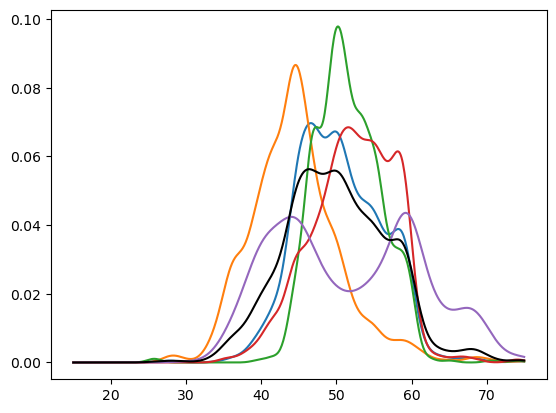

In [58]:
for mas in mask_u.T:
    x, y = kde(Lat[mas], None, np.arange(15, 75.1, .1), scaled=False, return_x=True, bw_method=0.2)
    plt.plot(x, y)
x, y = kde(Lat, None, np.arange(15, 75.1, .1), scaled=False, return_x=True, bw_method=0.2)
plt.plot(x, y, color='black')

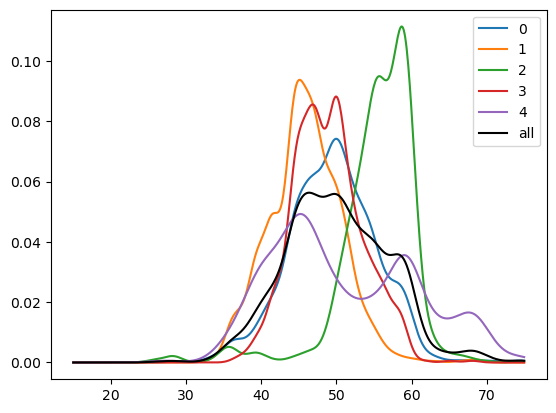

In [45]:
for i, mas in enumerate(mask_u.T):
    x, y = kde(Lat[mas], None, np.arange(15, 75.1, .1), scaled=False, return_x=True, bw_method=0.2)
    plt.plot(x, y, label=i)
x, y = kde(Lat, None, np.arange(15, 75.1, .1), scaled=False, return_x=True, bw_method=0.2)
plt.plot(x, y, color='black', label='all')
plt.legend()

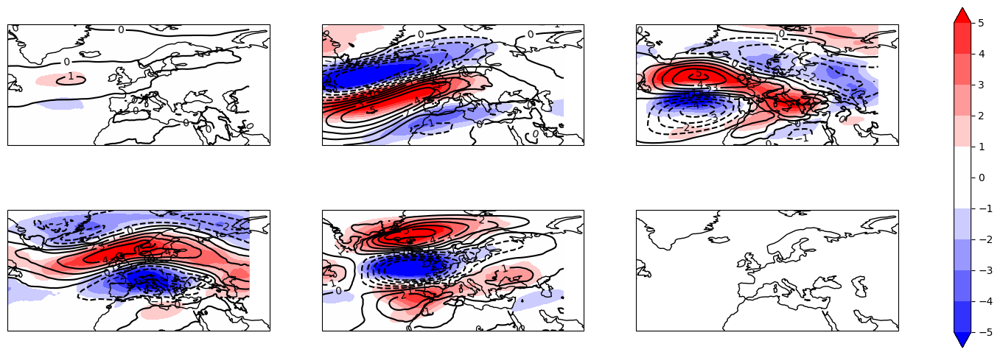

In [63]:
clu = Clusterplot(2, 3)
clu.add_any_contour_from_mask(da_u, mask_u, type='contour', clabels=True)
clu.add_any_contour_from_mask(da_wind, mask_u, type='contourf')

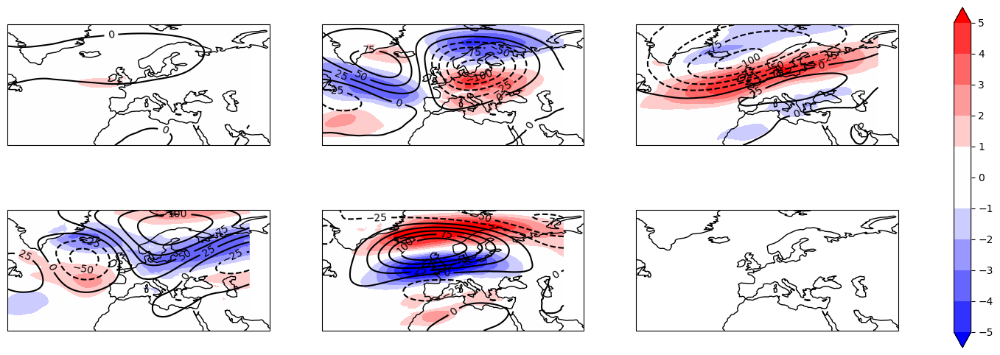

In [55]:
clu = Clusterplot(2, 3)
clu.add_any_contour_from_mask(da_u, mask_z, type='contourf')
clu.add_any_contour_from_mask(da_z, mask_z, type='contour', clabels=True)

In [49]:
da_wind_zm = da_wind_abs.mean(dim='lon')

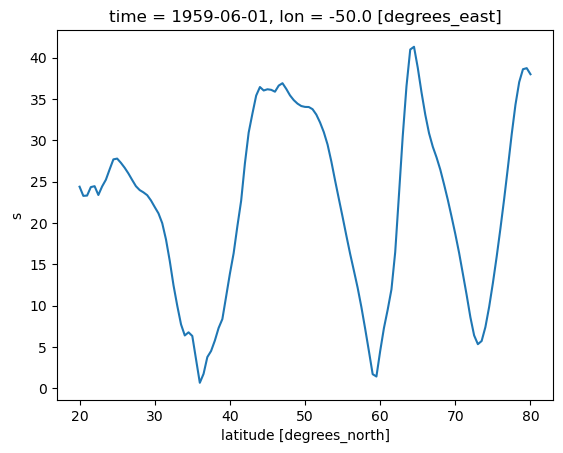

In [54]:
da_wind_abs[0, :, 20].plot()

In [8]:
X, da_u = exp_u.prepare_for_clustering()
X = exp_u.opp_transform(X, 25, 10, 1)
opp_labels = cluster_from_projs(X, cutoff=4)
unique_labels = np.asarray([-1, -2, -3, -4, 0, 1, 2, 3, 4])
mask = opp_labels[:, None] == unique_labels[None, :]
titles=[f'OPP {unique_labels[i]}, {np.mean(mas) * 100:.1f}%' for i, mas in enumerate(mask.T)]

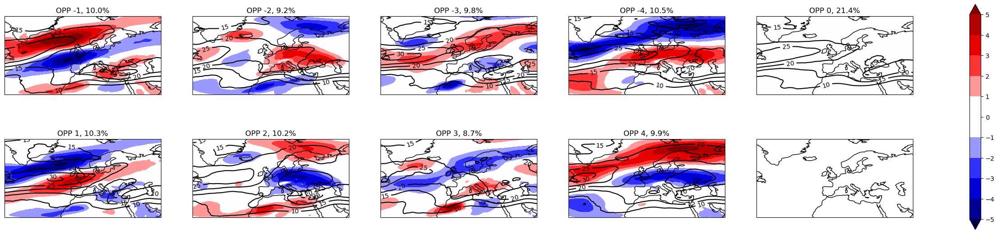

In [12]:
clu = Clusterplot(2, 5, (-60, 60, 20, 80))
clu.add_any_contour_from_mask(da_u, mask, titles=titles)
clu.add_any_contour_from_mask(da_wind_abs, mask=mask, type='contour', clabels=True)

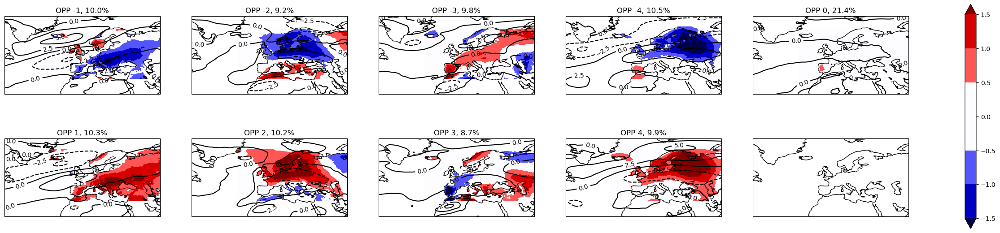

In [15]:
clu = Clusterplot(2, 5, (-60, 60, 20, 80))
clu.add_any_contour_from_mask(da_T, mask, titles=titles)
clu.add_any_contour_from_mask(da_u, mask=mask, type='contour', nlevels=3, linestyles=['dashed', 'solid'], clabels=True)

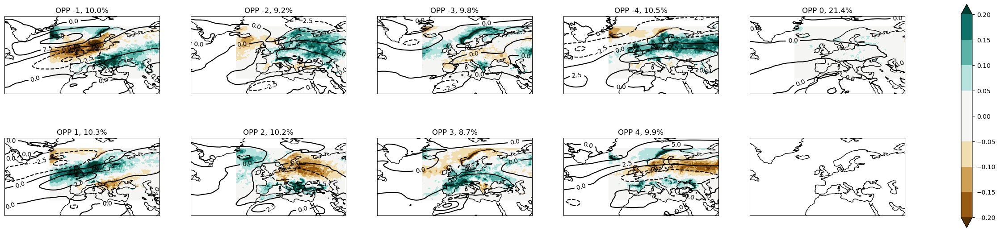

In [16]:
clu = Clusterplot(2, 5, (-60, 60, 20, 80))
clu.add_any_contour_from_mask(da_tp * 1000, mask, titles=titles, cmap='BrBG')
clu.add_any_contour_from_mask(da_u, mask=mask, type='contour', nlevels=3, linestyles=['dashed', 'solid'], clabels=True)

# $T_1$ OPPs

In [ ]:
X1 = exp_wind.opp_transform(X, 150, 10, type=1)
X2 = exp_wind.opp_transform(X, 150, 10, type=2)

In [55]:
res = cluster_from_projs(X1, X2)

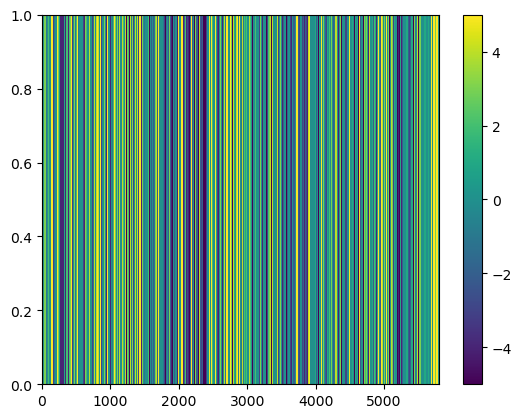

In [51]:
im = plt.pcolormesh(res[:, None].T)
plt.colorbar(im)

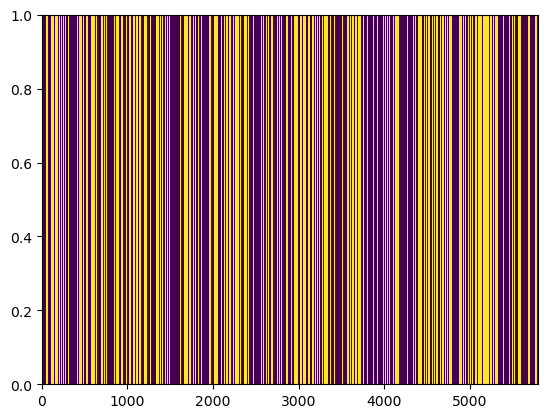

In [58]:
im = plt.pcolormesh((res[:, None].T != 0) & (res[:, None].T % 2 == 0))


# $T_2$ OPPs

In [ ]:
eigenvals_T2, OPPs_T2, path_T2 = exp_wind.compute_opps(150, return_realspace=True, type=2)
raw_OPPs_T2 = load_pickle(path_T2)['OPPs']
OPP_timeseries_T2 = exp_wind.opp_transform(X, 150, 10, type=2)
mask_high_T2 = OPP_timeseries_T2 > 2
mask_low_T2 = OPP_timeseries_T2 < -2
mask_max_T2 = np.argmax(OPP_timeseries_T2, axis=1)[:, None] == np.arange(OPP_timeseries_T2.shape[1])[None, :]
mask_min_T2 = np.argmin(OPP_timeseries_T2, axis=1)[:, None] == np.arange(OPP_timeseries_T2.shape[1])[None, :]

OPP_timeseries_da_T2 = xr.DataArray(
    OPP_timeseries_T2, 
    coords={'time': da_wind.time, 'OPP': np.arange(OPP_timeseries_T2.shape[1])}
)
hotspells, maxnhs, maxlen = get_hostpells_v2()
OPP_mask_da_T2 = apply_hotspells_mask_v2(hotspells, OPP_timeseries_da_T2, maxlen, maxnhs)

# $T_1$ vs. $T_2$

## Absolute

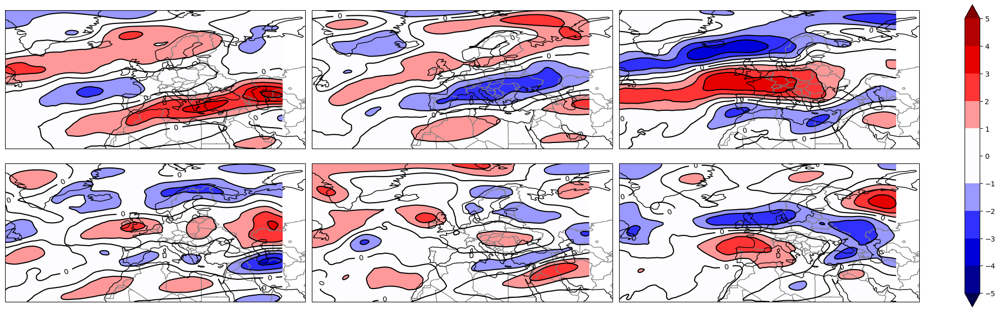

In [ ]:
clu = Clusterplot(2, 3)
clu.add_contourf([OPPs_T1[i] for i in range(6)], clabels=[0])

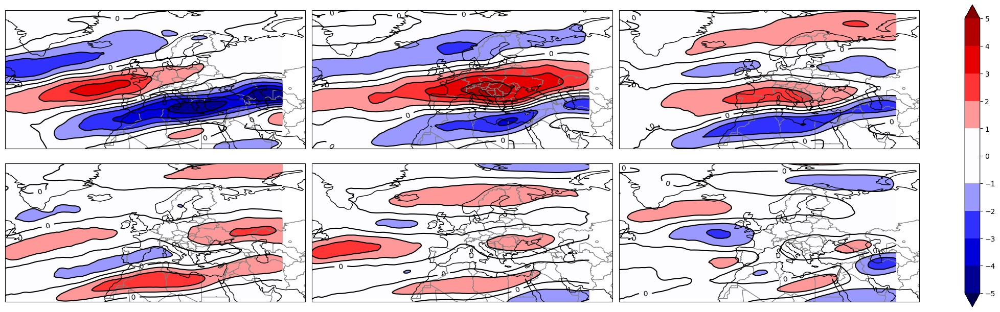

In [ ]:
clu = Clusterplot(2, 3)
clu.add_contourf([OPPs_T2[i] for i in range(6)], clabels=[0])

## As means + mean absolute wind on these clusters

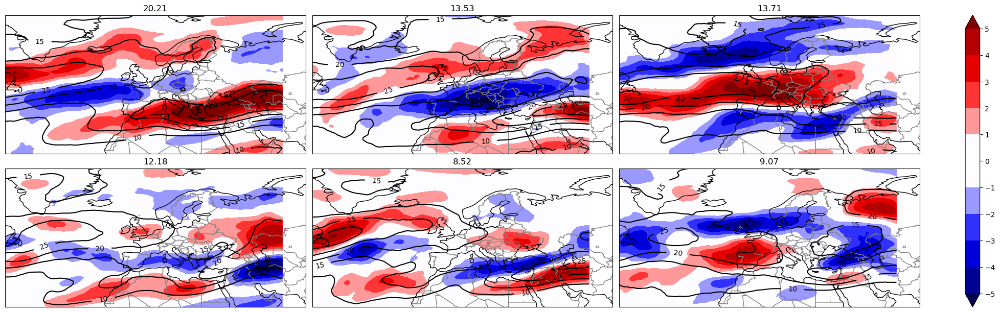

In [13]:
clu = Clusterplot(2, 3)
im = clu.add_any_contour_from_mask(da_wind, mask=mask_max_T1, type='contourf')
clu.add_any_contour_from_mask(da_wind_abs, mask=mask_max_T1, type='contour', clabels=True, titles=eigenvals_T1)

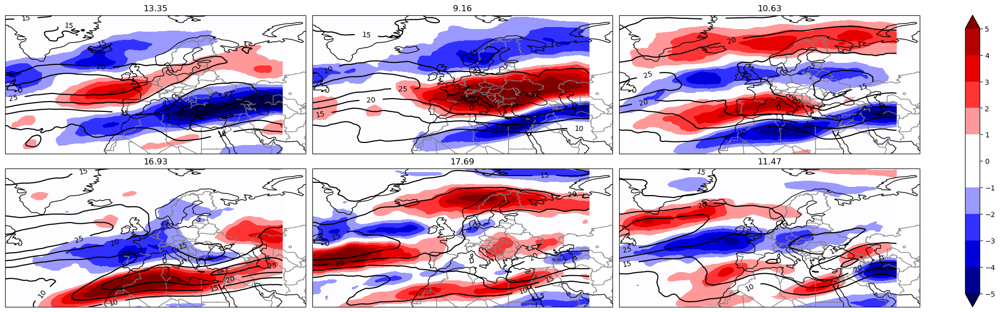

In [14]:
clu = Clusterplot(2, 3)
im = clu.add_any_contour_from_mask(da_wind, mask=mask_max_T2, type='contourf')
clu.add_any_contour_from_mask(da_wind_abs, mask=mask_max_T2, type='contour', clabels=True, titles=eigenvals_T2)

# OPPs vs. hotspells

/home/hugo/mambaforge-pypy3/envs/env11/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1577: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


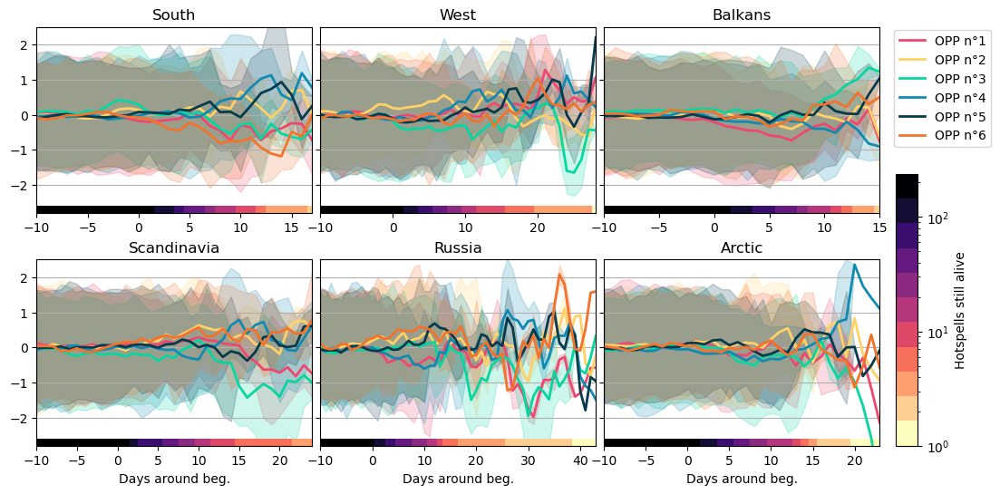

In [69]:
fig, axes = plt.subplots(2, 3, figsize=(12, 6))
fig.subplots_adjust(wspace=0.03, hspace=0.25)
axes = axes.flatten()
means = OPP_mask_da_T1.isel(OPP=np.arange(6)).mean(dim='hotspell')
quantiles = OPP_mask_da_T1.isel(OPP=np.arange(6)).quantile([0.05, 0.95], dim='hotspell')
pops = (~OPP_mask_da_T1.isnull()).isel(OPP=0).sum(dim='hotspell')
pop_cmap = ListedColormap(mpl.colormaps['magma'].reversed()(np.linspace(0, 1, 11)))
for i, (ax, region) in enumerate(zip(axes, REGIONS)):
    for OPP, color in zip(range(6), COLORS5):
        this = means.sel(region=region).isel(OPP=OPP)
        maxidx = np.sum(~np.isnan(this.values))
        this = this[:maxidx]
        q1, q2 = quantiles.sel(region=region).isel(OPP=OPP)[:, :maxidx]
        ax.plot(this.day_after_beg, this, lw=2, color=color, label=f'OPP n°{OPP + 1}')
        ax.fill_between(this.day_after_beg, q1, q2, color=color, alpha=0.2)
    ax.set_title(region)
    im = ax.pcolormesh(np.arange(pops.shape[1] + 1)[:(maxidx + 1)] - 10.5, [-2.8, -2.6], pops.sel(region=region).values[:maxidx, None].T, cmap=pop_cmap, vmin=1, vmax=pops.max(), norm='log')
    ax.set_xlim(this.day_after_beg[[0, -1]].values)
    ax.set_ylim([-2.8, 2.5])
    if i % 3 == 0:
        ax.set_yticks([-2, -1, 0, 1, 2])
    else:
        ax.set_yticks([-2, -1, 0, 1, 2], [''] * 5)
    if i > 2:
        ax.set_xlabel('Days around beg.')
    ax.grid(True, axis='y')
leg = axes[2].legend(ncol=1, loc='upper left', bbox_to_anchor=(1.03, 1.02))

width = 0.02
xmin = 1 + width * 2 - axes[3].get_position().xmin
height = 0.5
ymin = axes[-1].get_position().ymin
cax = fig.add_axes([xmin, ymin, width, height])
fig.colorbar(im, cax=cax, label='Hotspells still alive')

/home/hugo/mambaforge-pypy3/envs/env11/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1577: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


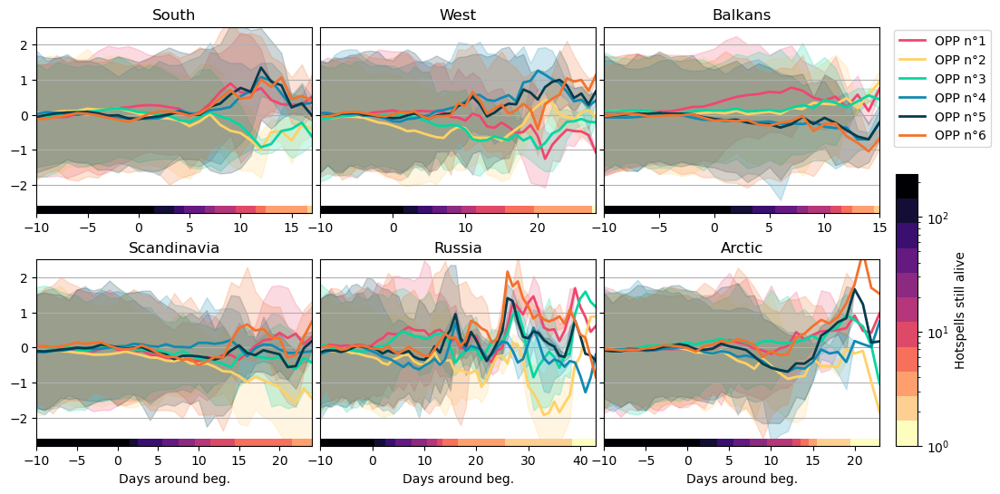

In [12]:
fig, axes = plt.subplots(2, 3, figsize=(12, 6))
fig.subplots_adjust(wspace=0.03, hspace=0.25)
axes = axes.flatten()
means = OPP_mask_da_T2.isel(OPP=np.arange(6)).mean(dim='hotspell')
quantiles = OPP_mask_da_T2.isel(OPP=np.arange(6)).quantile([0.05, 0.95], dim='hotspell')
pops = (~OPP_mask_da_T2.isnull()).isel(OPP=0).sum(dim='hotspell')
pop_cmap = ListedColormap(mpl.colormaps['magma'].reversed()(np.linspace(0, 1, 11)))
for i, (ax, region) in enumerate(zip(axes, REGIONS)):
    for OPP, color in zip(range(6), COLORS5):
        this = means.sel(region=region).isel(OPP=OPP)
        maxidx = np.sum(~np.isnan(this.values))
        this = this[:maxidx]
        q1, q2 = quantiles.sel(region=region).isel(OPP=OPP)[:, :maxidx]
        ax.plot(this.day_after_beg, this, lw=2, color=color, label=f'OPP n°{OPP + 1}')
        ax.fill_between(this.day_after_beg, q1, q2, color=color, alpha=0.2)
    ax.set_title(region)
    im = ax.pcolormesh(np.arange(pops.shape[1] + 1)[:(maxidx + 1)] - 10.5, [-2.8, -2.6], pops.sel(region=region).values[:maxidx, None].T, cmap=pop_cmap, vmin=1, vmax=pops.max(), norm='log')
    ax.set_xlim(this.day_after_beg[[0, -1]].values)
    ax.set_ylim([-2.8, 2.5])
    if i % 3 == 0:
        ax.set_yticks([-2, -1, 0, 1, 2])
    else:
        ax.set_yticks([-2, -1, 0, 1, 2], [''] * 5)
    if i > 2:
        ax.set_xlabel('Days around beg.')
    ax.grid(True, axis='y')
leg = axes[2].legend(ncol=1, loc='upper left', bbox_to_anchor=(1.03, 1.02))

width = 0.02
xmin = 1 + width * 2 - axes[3].get_position().xmin
height = 0.5
ymin = axes[-1].get_position().ymin
cax = fig.add_axes([xmin, ymin, width, height])
fig.colorbar(im, cax=cax, label='Hotspells still alive')

In [10]:
raw = pd.read_csv(f'/scratch2/hugo/ERA5/norm.daily.nao.cdas.z500.19500101_current.csv')
dates = pd.to_datetime(raw.iloc[:, [0, 1, 2]])
data = raw.iloc[:, -1]
NAO = xr.DataArray(data.values, coords=dict(time=dates.values))
common_times = np.intersect1d(NAO.time.values, OPP_timeseries_da_T1.time.values)
NAO_JJA = NAO.sel(time=common_times).values

In [11]:
[np.mean(NAO_JJA[mask]) for mask in mask_high_T1.T]

[0.07854666656348855,
 -0.09755795674720161,
 -0.5707577202133834,
 -0.1724520359710123,
 0.23321859017834537,
 -0.3858520935053491,
 -0.09062434074149778,
 0.08327923309313522,
 0.11331965207279909,
 -0.11256466307411023]

In [86]:
common_times = np.intersect1d(NAO.time.values, OPP_timeseries_da_T1.time.values)
for i in range(OPP_timeseries_da_T1.shape[1]):
    print(i, np.corrcoef(NAO.sel(time=common_times).values, OPP_timeseries_da_T1.sel(OPP=i, time=common_times).values)[1, 0])

0 0.1751041764479272
1 0.02951350583856615
2 -0.30233775323196466
3 -0.052885237814196386
4 0.08766291637064083
5 -0.15979955633187398
6 -0.06979774873238209
7 0.022751947915804205
8 0.0012677176983705769
9 -0.028879618659409828


# OPPs versus T anomalies

100%|██████████| 6/6 [00:18<00:00,  3.02s/it]


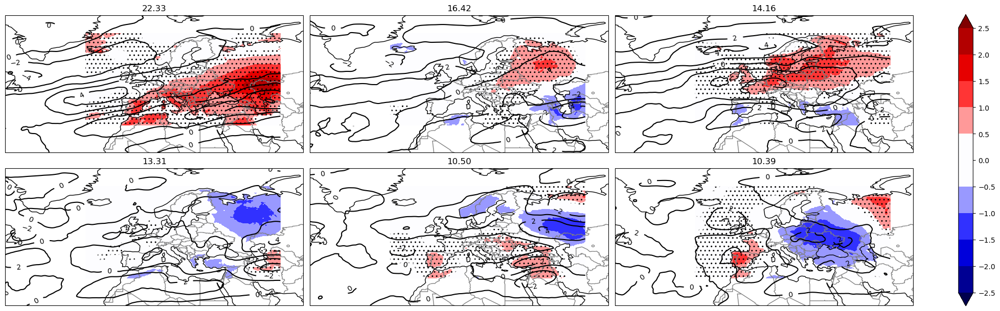

In [12]:
clu = Clusterplot(2, 3)
im = clu.add_any_contour_from_mask(da_T, mask=mask_max_T1, stippling=True, type='contourf')
clu.add_any_contour_from_mask(da_wind, mask=mask_max_T1, type='contour', clabels=True, titles=eigenvals_T1)

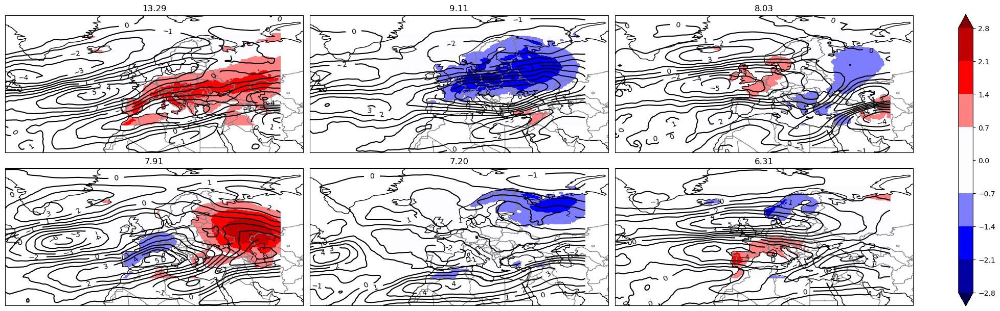

In [12]:
clu = Clusterplot(2, 3)
im = clu.add_any_contour_from_mask(da_T, mask=mask_max_T2, type='contourf')
clu.add_any_contour_from_mask(da_wind, mask=mask_max_T2, type='contour', clabels=True, titles=eigenvals_T2)

# OPPs vs prec anomalies

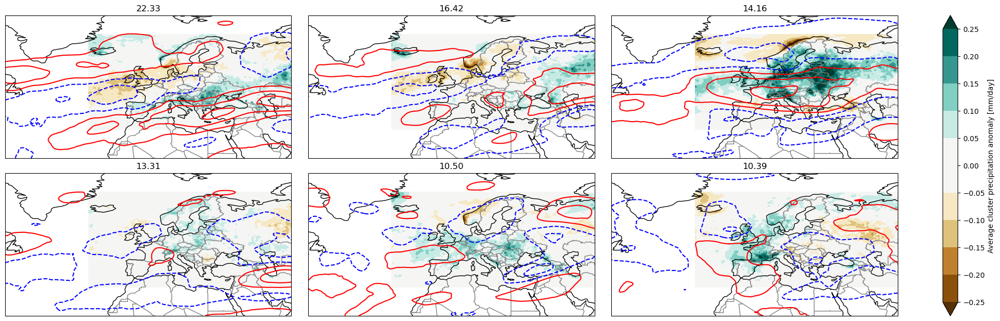

In [16]:
clu = Clusterplot(2, 3)
im = clu.add_any_contour_from_mask(da_prec, mask=mask_max_T1, type='contourf')
clu.add_any_contour_from_mask(da_wind, mask=mask_max_T1, type='contour', clabels=True, titles=eigenvals_T1)

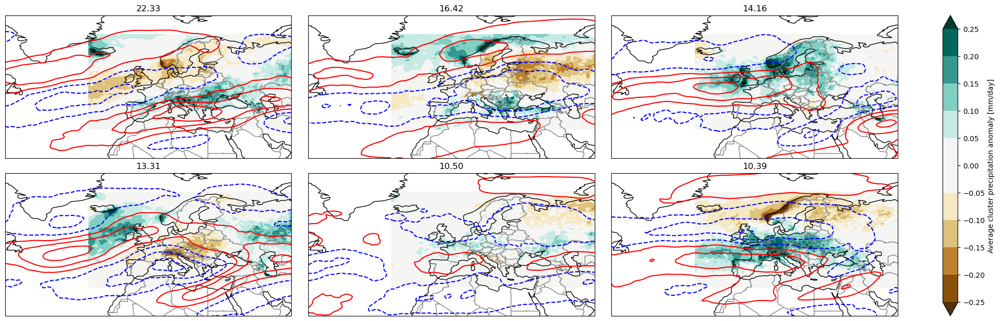

In [17]:
clu = Clusterplot(2, 3)
im = clu.add_any_contour_from_mask(da_prec, mask=mask_max_T2, type='contourf')
clu.add_any_contour_from_mask(da_wind, mask=mask_max_T2, type='contour', clabels=True, titles=eigenvals_T2)

# Leave-one-out logistic regression

In [88]:
if NODE == 'CLIM':
    streamers = xr.open_dataset('/scratch3/severin/rwb_index/era5/era5_av_streamer_75.nc')['flag_1']
streamers1 = streamers.sel(time=(streamers.time.dt.season=='JJA'), lon=slice(-60, 60), lat=slice(20, 80)) == 1
streamers2 = streamers.sel(time=(streamers.time.dt.season=='JJA'), lon=slice(-60, 60), lat=slice(20, 80)) == 2
timemask_streamer = np.isin(DATERANGEPL_SUMMER, streamers1.time.values)
mu = streamers1.mean(dim='time')

In [112]:
from sklearn.linear_model import LinearRegression, LogisticRegressionCV, LogisticRegression
from sklearn.multioutput import MultiOutputRegressor, MultiOutputClassifier
from sklearn.metrics import r2_score

Y = streamers1.values.reshape(streamers1.shape[0], -1)
mask = np.sum(Y, axis=0) > 4
Y = Y[:, mask]
X = OPP_timeseries_T1[timemask_streamer, :6]
nX = X.shape[1]
Xidx = np.vstack([np.ones(nX, dtype=bool), ~np.eye(nX, dtype=bool)])

In [113]:
from tqdm import tqdm
scores = np.zeros((X.shape[1] + 1, Y.shape[1]))

for i, y in tqdm(enumerate(Y.T), total=np.sum(mask)):
    for j, xidx in enumerate(Xidx):
        log = LogisticRegression(class_weight='balanced')
        log.fit(X[:, xidx], y)
        scores[j, i] = log.score(X[:, xidx], y)

 10%|▉         | 332/3325 [01:09<10:28,  4.76it/s]


KeyboardInterrupt: 

In [99]:
full = scores[0]
loo = scores[1:]
predictor_importance = np.zeros((len(mask), nX))
predictor_importance[mask, :] = (1 - (1 - full) / (1 - loo)).T
predictor_importance[predictor_importance < 0] = 0
predictor_importance = predictor_importance.reshape((*streamers1.shape[1:], 6))

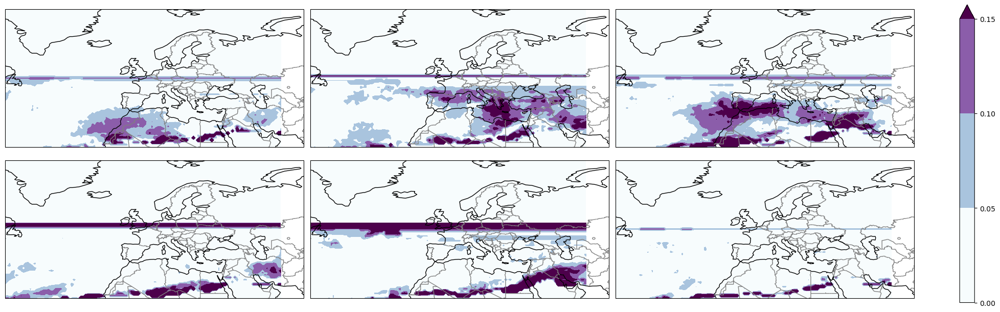

In [100]:
predictor_importance = xr.DataArray(
    predictor_importance, 
    coords={'lat': streamers1.lat.values, 'lon': streamers1.lon.values, 'OPP': np.arange(6)}
)
clu = Clusterplot(2, 3)
clu.add_contourf([predictor_importance[:, :, i] for i in range(6)])

# Regionalized T anomalies

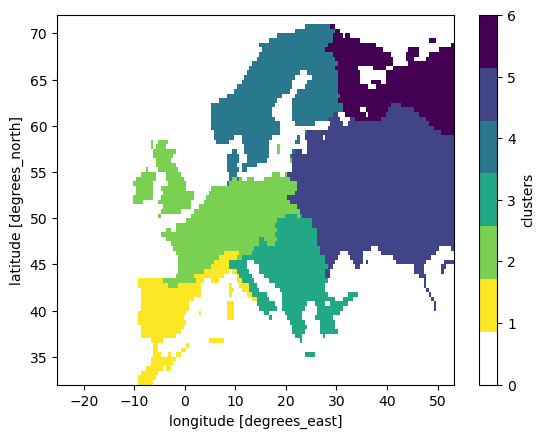

In [ ]:
duncan_mask = np.abs(xr.open_dataarray(f'{DATADIR}/ERA5/clusters_n6_eu_3w-def_correct-order.nc').fillna(0))
cmap = mpl.colormaps['viridis'].reversed()(np.linspace(0, 1, 6))
cmap = np.vstack([[1, 1, 1, 1], cmap])
cmap = ListedColormap(cmap)
duncan_mask.plot(cmap=cmap)

In [ ]:
exp_T = Experiment(exp_wind.dataset, 'Temperature', '2m', 'box_-25_60_32_72', 't')
da_T = exp_T.open_da('anomaly', 'JJA')
da_T = da_T.interp(lon=duncan_mask.lon, lat=duncan_mask.lat).assign_coords({'mask': duncan_mask})

In [ ]:
coords = {'time': da_T.time, 'region': REGIONS, 'quant': ['mean', 'median', 'min', 'max', 'q05', 'q95']}
timeseries = xr.DataArray(np.zeros([len(val) for val in coords.values()]), coords=coords)
for i, region in enumerate(REGIONS):
    base = da_T.where(da_T.mask==i + 1)
    timeseries.loc[:, region, 'mean'] = base.mean(dim=['lon', 'lat'])
    timeseries.loc[:, region, 'median'] = base.median(dim=['lon', 'lat'])
    timeseries.loc[:, region, 'min'] = base.min(dim=['lon', 'lat'])
    timeseries.loc[:, region, 'max'] = base.max(dim=['lon', 'lat'])
    timeseries.loc[:, region, 'q05'] = base.quantile(0.05, dim=['lon', 'lat'])
    timeseries.loc[:, region, 'q95'] = base.quantile(0.95, dim=['lon', 'lat'])
series2 = timeseries.values.reshape(-1, 36)
series1 = OPP_timeseries
corr = np.corrcoef(series1, series2, rowvar=False)
n_opp = OPP_timeseries.shape[1]
xcorr = corr[n_opp:, :n_opp]
xcorr = xr.DataArray(
    xcorr.reshape(6, 6, 180), 
    coords={
        'region': REGIONS, 'quant': ['mean', 'median', 'min', 'max', 'q05', 'q95'], 'OPP': np.arange(n_opp)},
)

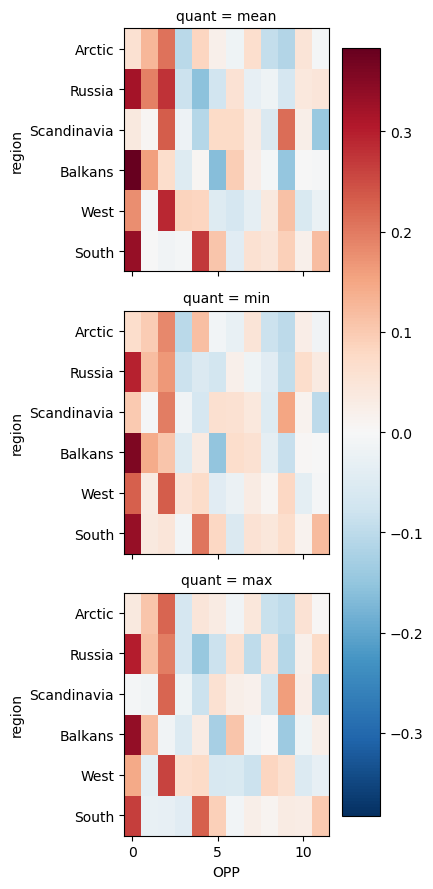

In [ ]:
xcorr.isel(OPP=np.arange(12), quant=[0, 2, 3]).plot.imshow(row='quant')

# DST

In [18]:
import CDSK as ck

In [19]:
ld, theta, alpha = ck.dynamical_local_indexes(X)
mu_ld, sigma_ld = np.mean(ld), np.std(ld)
mu_theta, sigma_theta = np.mean(theta), np.std(theta)

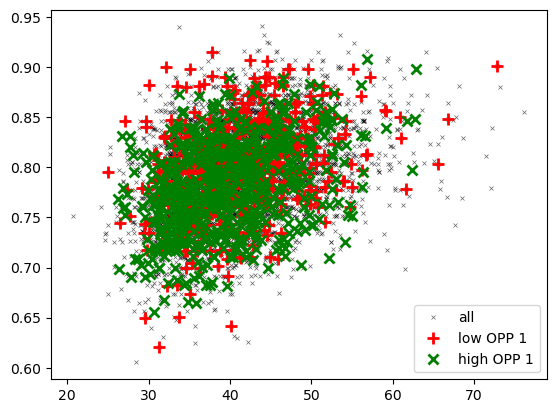

In [21]:
plt.plot(ld[:, 0, 0], theta[:, 0, 0], 'kx', mew=0.5, ms=3, alpha=0.6, label='all')
plt.plot(ld[mask_min_T1[:, 0], 0, 0], theta[mask_min_T1[:, 0], 0, 0], 'r+', mew=2, ms=9, label='low OPP 1')
plt.plot(ld[mask_max_T1[:, 0], 0, 0], theta[mask_max_T1[:, 0], 0, 0], 'gx', mew=2, ms=7, label='high OPP 1')
plt.legend()

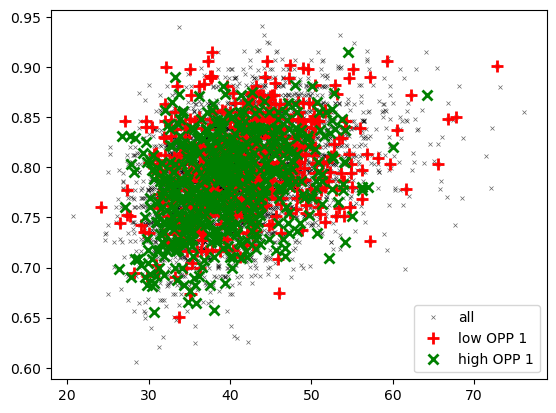

In [22]:
plt.plot(ld[:, 0, 0], theta[:, 0, 0], 'kx', mew=0.5, ms=3, alpha=0.6, label='all')
plt.plot(ld[mask_min_T2[:, 0], 0, 0], theta[mask_min_T2[:, 0], 0, 0], 'r+', mew=2, ms=9, label='low OPP 1')
plt.plot(ld[mask_max_T2[:, 0], 0, 0], theta[mask_max_T2[:, 0], 0, 0], 'gx', mew=2, ms=7, label='high OPP 1')
plt.legend()

In [84]:
ds_dsi = xr.Dataset(coords={'time': da_wind.time.values})
ds_dsi['ld'] = ('time', ld.flatten())
ds_dsi['theta'] = ('time', theta.flatten())

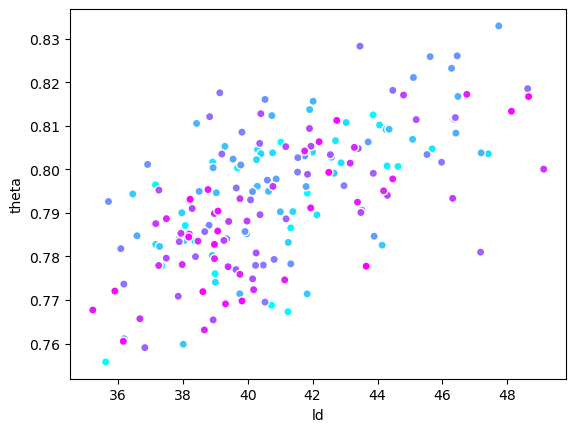

In [85]:
ds_dsi.resample(time='1M').mean(dim='time').plot.scatter(x='ld', y='theta', hue='time', cmap='cool', add_colorbar=False, add_legend=False)

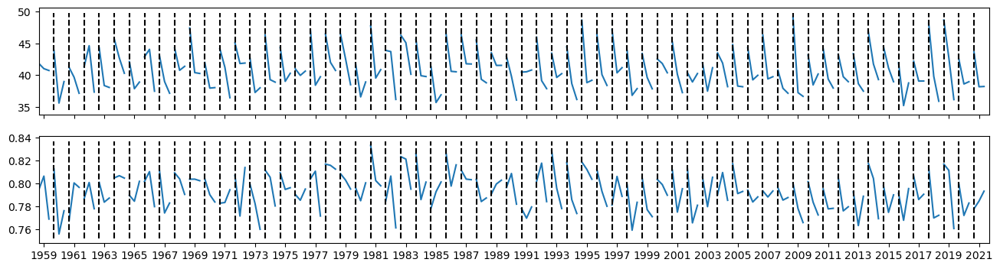

In [106]:
base = ds_dsi.resample(time='1M').mean(dim='time')
base = base.isel(time=np.isin(base.time.dt.month, [6, 7, 8]))
fig, axes = plt.subplots(2, 1, sharex=True, figsize=(16, 4))
lensummer = np.sum((base.time.dt.year == 1959).values)
years = np.unique(base.time.dt.year.values)
numsummer = len(years)
indices = np.arange(len(base.time)).reshape((numsummer, lensummer))
for idxs in indices:
    axes[0].plot(idxs, base['ld'][idxs].values, color='tab:blue')
    axes[1].plot(idxs, base['theta'][idxs].values, color='tab:blue')
axes[0].set_xlim([0, len(base.time)])
axes[0].set_xticks(np.arange(int(lensummer / 2), len(base.time), 2 * lensummer), years[::2])
for ax in axes:
    ylims = ax.get_ylim()
    ax.vlines(np.arange(lensummer, len(base.time), lensummer), ylims[0], ylims[1], color='black', ls='dashed')